# Important note:
This notebook uses data (Ecopia building footprints) that cannot be publicly available due to copyrights.

In [1]:
import glob
import os
from pathlib import Path
from os import path

import geopandas as gpd
import libpysal
import math
import matplotlib.pyplot as plt
import momepy
import numpy as np
import pandas as pd
import statistics

from matplotlib_scalebar.scalebar import ScaleBar
from momepy.utils import _azimuth
from pysal.lib import weights
from scipy import spatial
from tqdm import tqdm

# 1. Input data

In [2]:
cwd = os.getcwd()
root_dir = Path(cwd).parent

In [3]:
# Inputs
buildings_azi = gpd.read_file(path.join(root_dir,
                                        "data_confidential/raw/maps/ABI_azito/Azi_buildings_for_morph_analysis.shp"))
perimetre_azi = gpd.read_file(path.join(root_dir,
                                        "data_confidential/raw/maps/ABI_azito/Azi_perimetre_EurSpImg.shp"))
buildings_willy = gpd.read_file(path.join(root_dir,
                                        "data_confidential/raw/maps/ABI_williamsville/Willy_buildings_for_morph_analysis.shp"))
perimetre_willy = gpd.read_file(path.join(root_dir,
                                          "data_confidential/raw/maps/ABI_williamsville/Willy_perimetre_EurSpImg.shp"))

In [4]:
buildings_azi['ID_momepy'] = buildings_azi.index.to_list()
buildings_willy['ID_momepy'] = buildings_willy.index.to_list()

# 2. Morphological analyses

### 2.1 Tesselation

In [5]:
limit_azi = momepy.buffered_limit(buildings_azi, buffer=100)
limit_willy = momepy.buffered_limit(buildings_willy, buffer=100)

In [6]:
tessellation_azi = momepy.Tessellation(buildings_azi, unique_id='ID_momepy', limit=limit_azi)
tessellation_willy = momepy.Tessellation(buildings_willy, unique_id='ID_momepy', limit=limit_willy)

Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...
Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


In [7]:
tessellation_azi_gdf = tessellation_azi.tessellation
tessellation_willy_gdf = tessellation_willy.tessellation

In [8]:
print('tessellation_azi (Azito):',tessellation_azi.shrink)
print('tessellation_willy (Willy)',tessellation_willy.shrink)

tessellation_azi (Azito): 0.4
tessellation_willy (Willy) 0.4


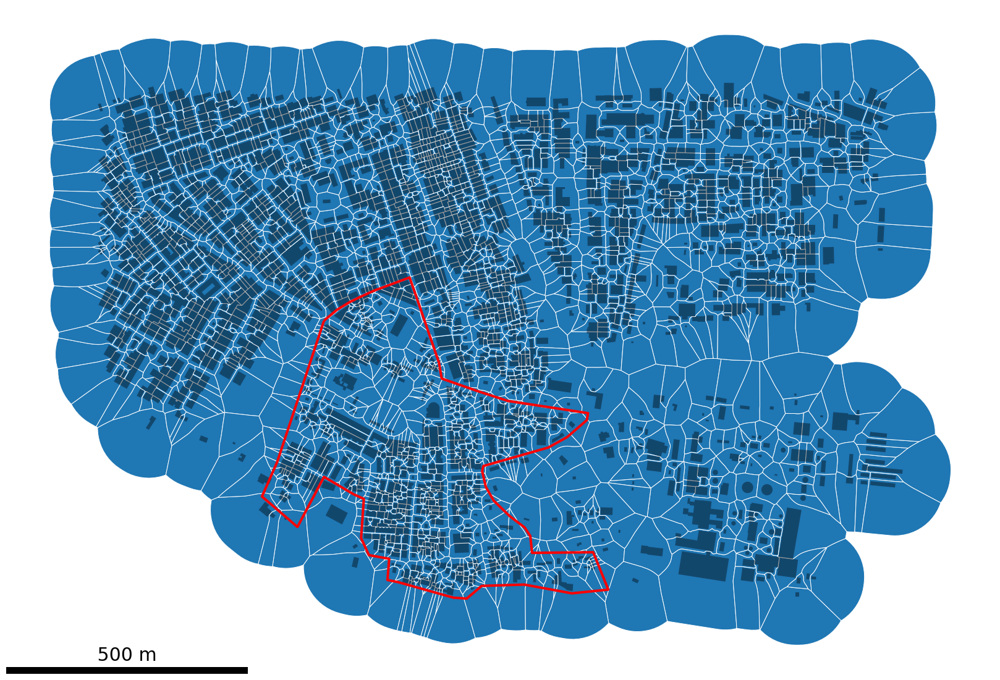

In [9]:
# Plot tessellation map of AZITO
f, ax = plt.subplots(figsize=(30, 20))
tessellation_azi_gdf.plot(ax=ax, edgecolor='white')
buildings_azi.plot(ax=ax, color='black', alpha=.4)
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
perimetre_azi.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=4)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_tesselation_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

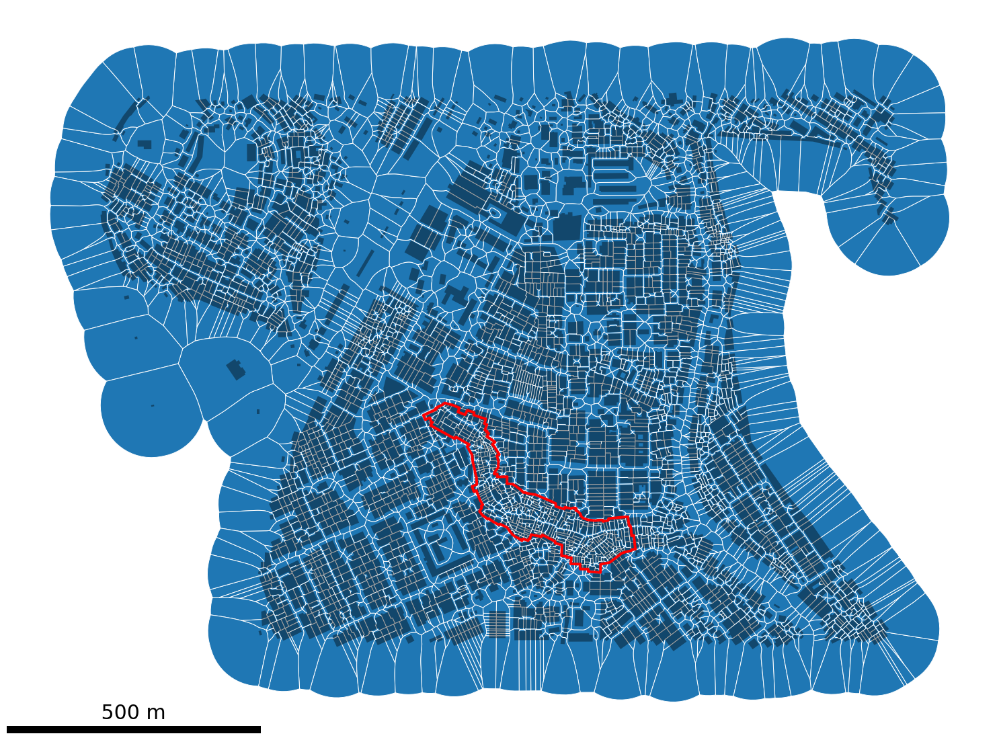

In [10]:
# Plot tessellation map of WILLY
f, ax = plt.subplots(figsize=(30, 20))
tessellation_willy_gdf.plot(ax=ax, edgecolor='white')
buildings_willy.plot(ax=ax, color='black', alpha=.4)
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
perimetre_willy.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=4)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_tesselation_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

### 2.2 Density indicators

#### 2.2.1 Intensity of land use (built up area)

In [11]:
# Calculate Covered Area Ratio (CAR) - AZITO
tessellation_azi_gdf['n_area'] = momepy.Area(tessellation_azi_gdf).series
buildings_azi['n_area'] = momepy.Area(buildings_azi).series
tess_car_azi = momepy.AreaRatio(tessellation_azi_gdf, buildings_azi, 'n_area', 'n_area', 'ID_momepy')
tessellation_azi_gdf['n_CAR'] = tess_car_azi.series

# Calculate Covered Area Ratio (CAR) - WILLY
tessellation_willy_gdf['n_area'] = momepy.Area(tessellation_willy_gdf).series
buildings_willy['n_area'] = momepy.Area(buildings_willy).series
tess_car_willy = momepy.AreaRatio(tessellation_willy_gdf, buildings_willy, 'n_area', 'n_area', 'ID_momepy')
tessellation_willy_gdf['n_CAR'] = tess_car_willy.series

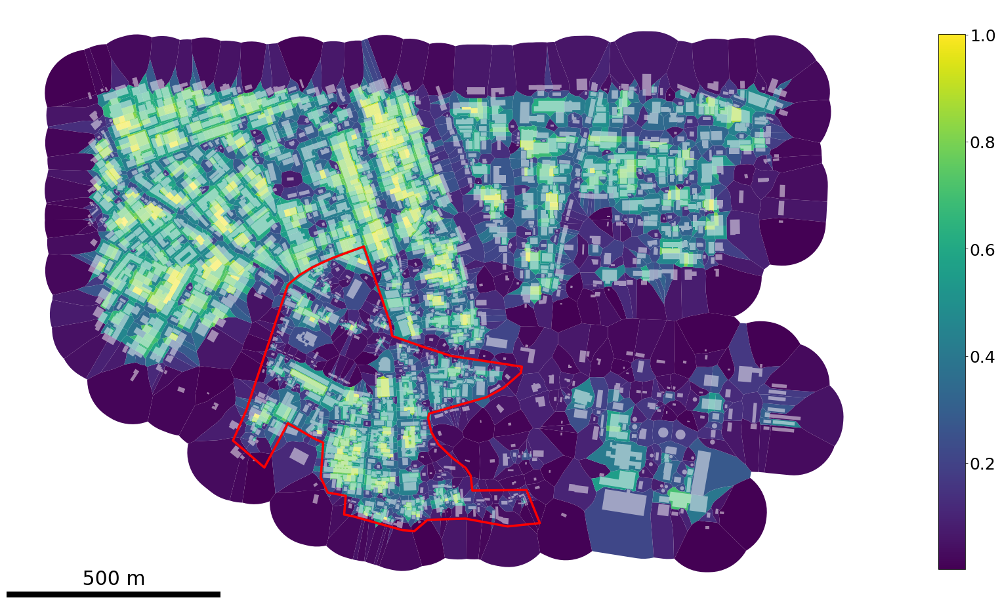

In [12]:
# Plot CAR map - AZITO
f, ax = plt.subplots(figsize=(30, 20))
tessellation_azi_gdf.plot(ax=ax, column='n_CAR',
                          categorical=False, cmap='viridis',
                          legend=True,legend_kwds={'shrink': 0.75})
buildings_azi.plot(ax=ax, color='white', alpha=0.5)
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_CAR_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

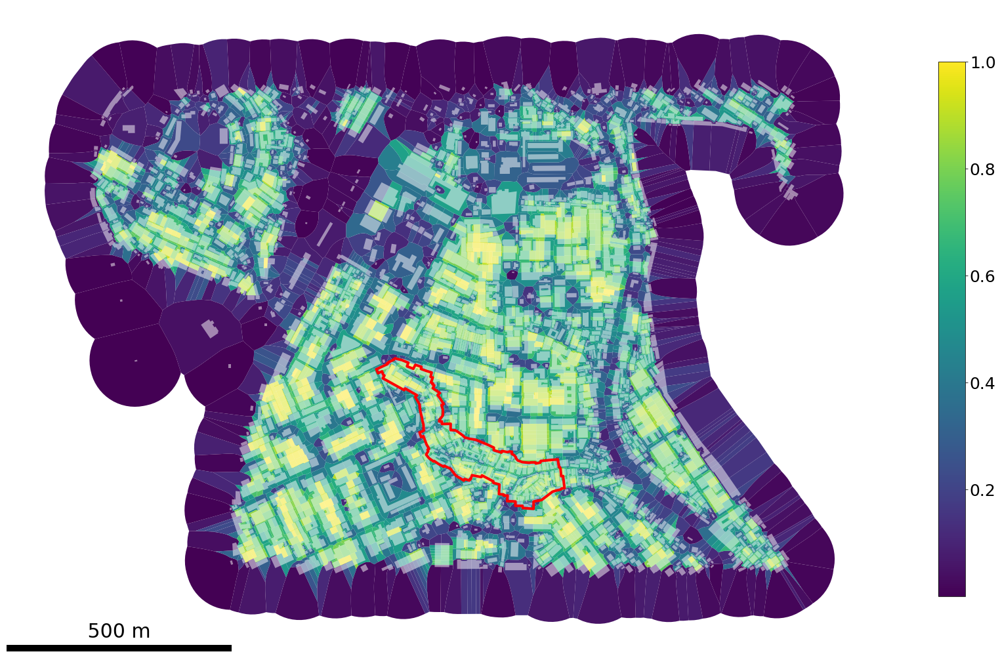

In [13]:
# Plot CAR map - WILLY
f, ax = plt.subplots(figsize=(30, 20))
tessellation_willy_gdf.plot(ax=ax, column='n_CAR',
                            categorical=False, cmap='viridis',
                            legend=True,legend_kwds={'shrink': 0.75})
buildings_willy.plot(ax=ax, color='white', alpha=0.5)
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=4)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_CAR_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

#### 2.2.2. Number of neighbours

Note: It may be necessary to manually enable the ipywidgets notebook extension (in Terminal app) with :  
jupyter nbextension enable --py widgetsnbextension

In [14]:
# Count neighbours in a given radius (100m, i.e. immediate environment) - AZITO
dist100 = libpysal.weights.DistanceBand.from_dataframe(buildings_azi, 100, ids='ID_momepy')
buildings_azi['NN_100'] = momepy.Neighbors(buildings_azi, dist100,'ID_momepy').series

# Count neighbours in a given radius (100m, i.e. immediate environment) - WILLY
dist100 = libpysal.weights.DistanceBand.from_dataframe(buildings_willy, 100, ids='ID_momepy')
buildings_willy['NN_100'] = momepy.Neighbors(buildings_willy, dist100,'ID_momepy').series

  0%|          | 0/2993 [00:00<?, ?it/s]

  0%|          | 0/4526 [00:00<?, ?it/s]

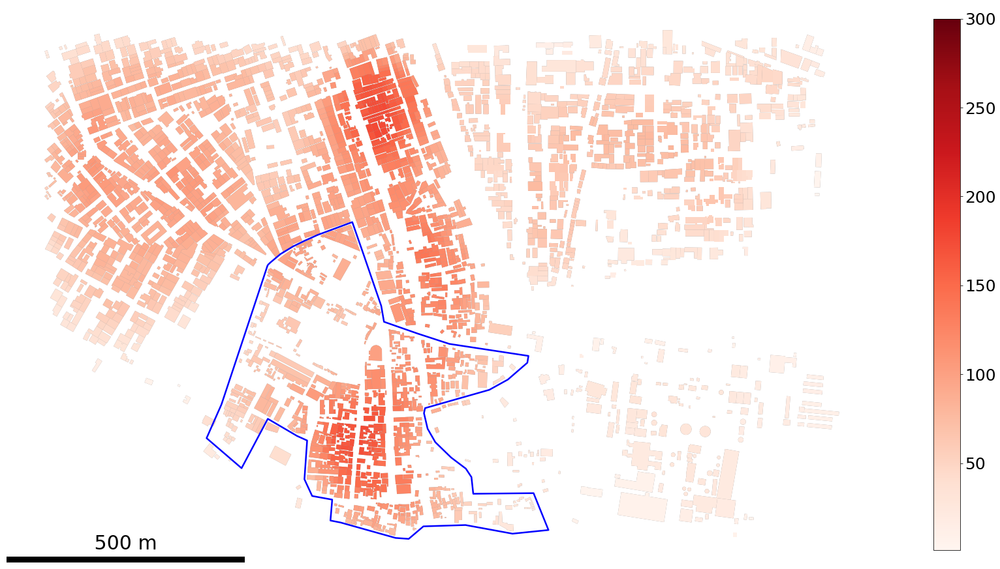

In [15]:
# Plot number of neighbours in a radius of 100 m (immediate environment) - AZITO
f, ax = plt.subplots(figsize=(30, 20))
buildings_azi.plot(ax=ax, color='black', alpha=.4)
buildings_azi.plot(ax=ax, column='NN_100',
                   vmin=1, vmax=300, cmap='Reds',
                   legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=2.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_NN_100_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

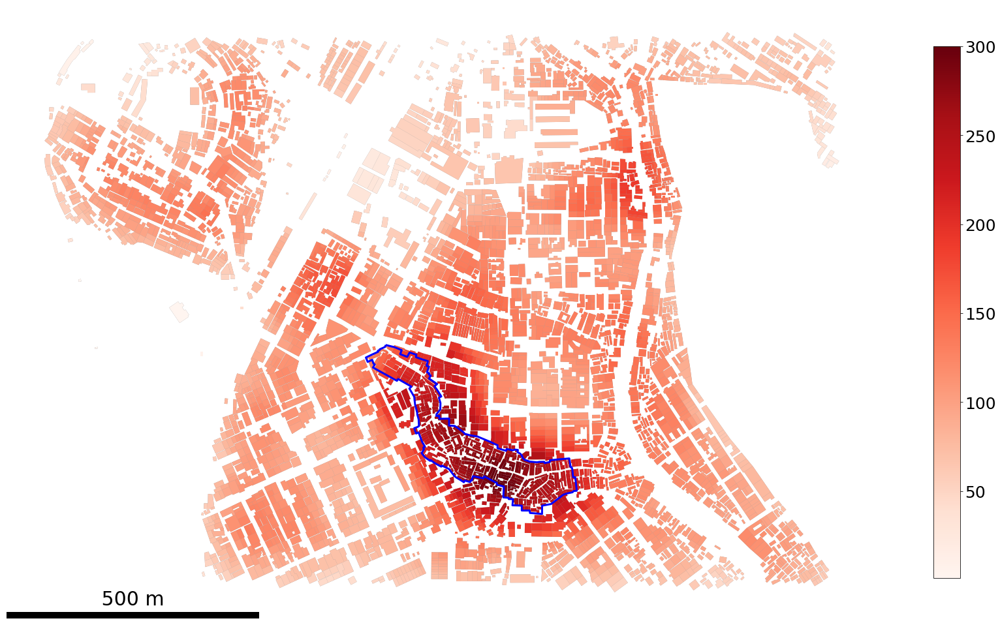

In [16]:
# Plot number of neighbours in a radius of 100 m (immediate environment) - WILLY
f, ax = plt.subplots(figsize=(30, 20))
buildings_willy.plot(ax=ax, color='black', alpha=.4)
buildings_willy.plot(ax=ax, column='NN_100',
                   vmin=1, vmax=300, cmap='Reds',
                   legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=3)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_NN_100_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

#### 2.2.3. Compactedness

Compactedness : Calculate the ratio of object area to the area of its smallest circumsribed circle  
Reference: http://dx.doi.org/10.1098/rsif.2014.0924

In [17]:
# Compactedness of buildings - AZITO
blg_cc_azi = momepy.CircularCompactness(buildings_azi)
buildings_azi['n_blg_cc'] = blg_cc_azi.series

# Compactedness of tessellation blocks - AZITO
tes_cc_azi = momepy.CircularCompactness(tessellation_azi_gdf)
tessellation_azi_gdf['n_tes_cc'] = tes_cc_azi.series

# Compactedness of buildings - WILLY
blg_cc_willy = momepy.CircularCompactness(buildings_willy)
buildings_willy['n_blg_cc'] = blg_cc_willy.series

# Compactedness of tessellation blocks - WILLY
tes_cc_willy = momepy.CircularCompactness(tessellation_willy_gdf)
tessellation_willy_gdf['n_tes_cc'] = tes_cc_willy.series

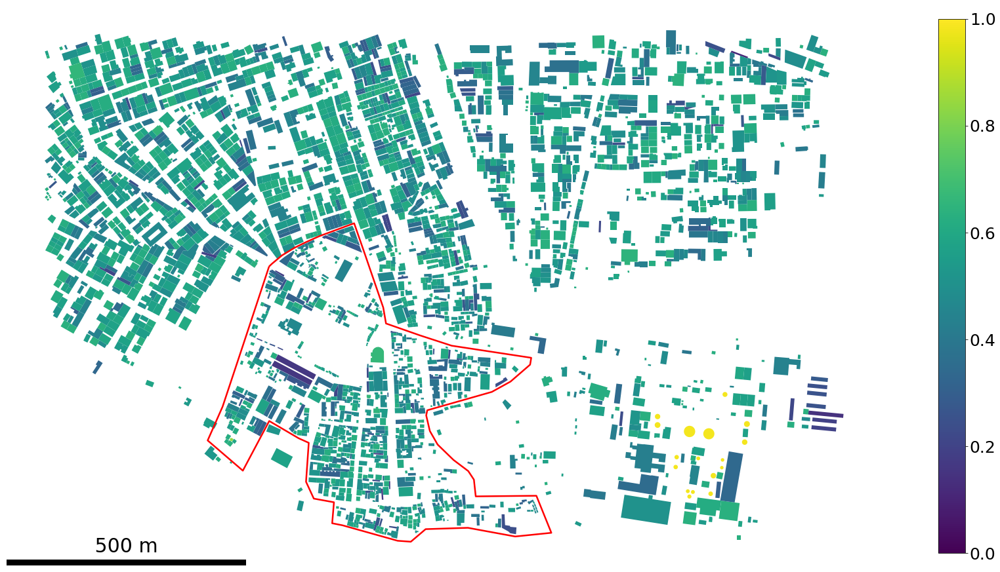

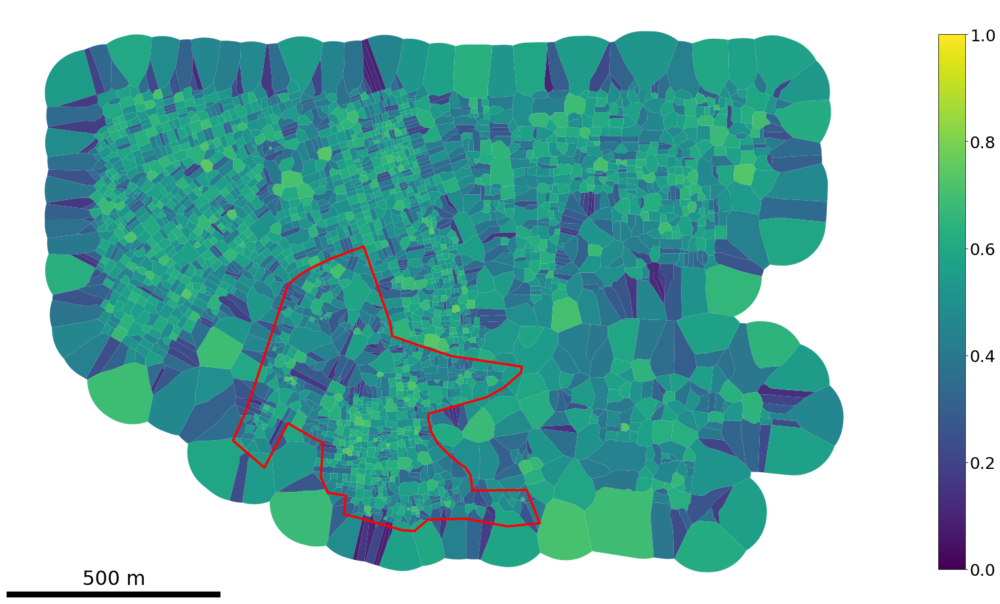

In [18]:
# Plot compactedness maps - AZITO

# Building compactedness
f, ax = plt.subplots(figsize=(30, 20))
buildings_azi.plot(ax=ax, column='n_blg_cc', vmin=0, vmax=1,
                   categorical=False, cmap='viridis',
                   legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=2.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_blg_cc_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

# Tesselation compactedness
f, ax = plt.subplots(figsize=(30, 20))
tessellation_azi_gdf.plot(ax=ax, column='n_tes_cc', vmin=0, vmax=1,
                          categorical=False, cmap='viridis',
                          legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_tes_cc_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

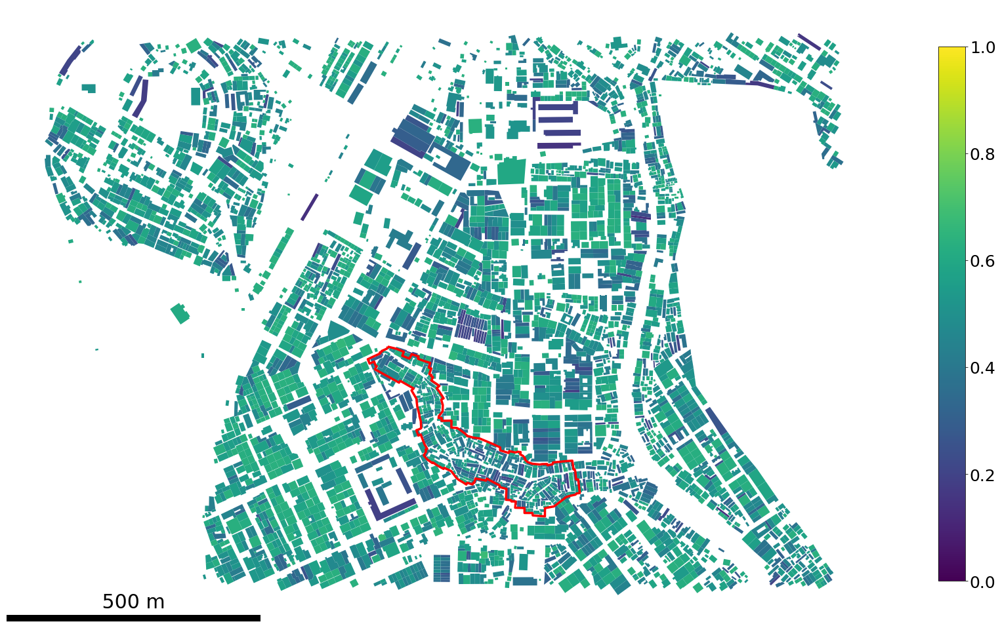

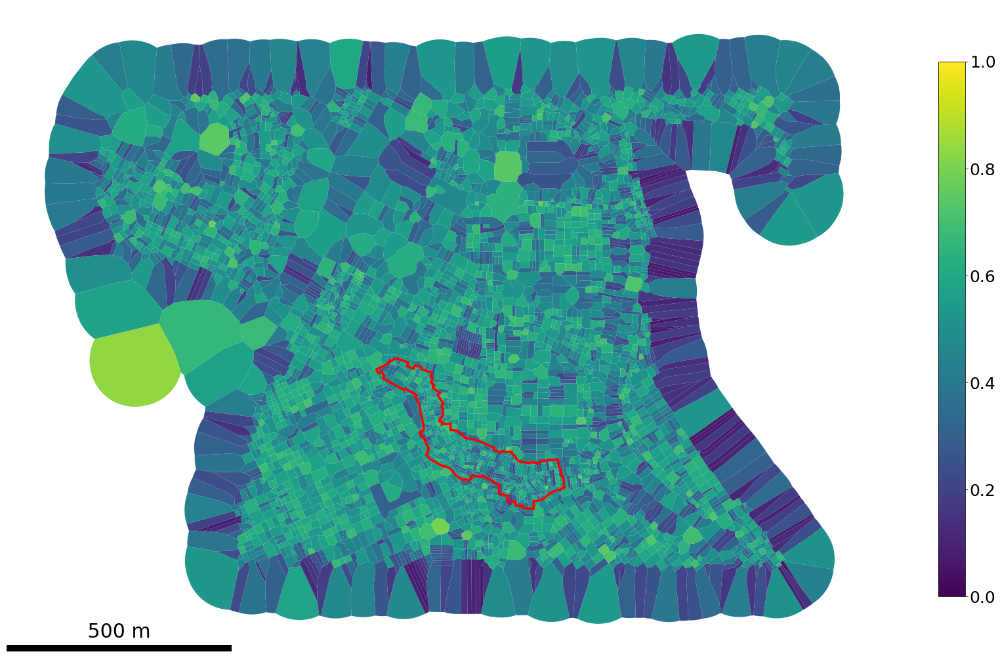

In [19]:
# Plot compactedness maps - WILLY

# Building compactedness
f, ax = plt.subplots(figsize=(30, 20))
buildings_willy.plot(ax=ax, column='n_blg_cc', vmin=0, vmax=1,
                     categorical=False, cmap='viridis',
                     legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_blg_cc_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

# Tesselation compactedness
f, ax = plt.subplots(figsize=(30, 20))
tessellation_willy_gdf.plot(ax=ax, column='n_tes_cc', vmin=0, vmax=1,
                            categorical=False, cmap='viridis',
                            legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='red', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_tes_cc_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

### 2.3 Entropy indicators

Calculate entropy based on building orientations  
Reference : https://doi.org/10.1016/j.apgeog.2018.02.002

#### 2.3.1. Calculate cardinal deviation of buildings

In [20]:
buildings_azi['n_car_dev'] = momepy.Orientation(buildings_azi).series
buildings_willy['n_car_dev'] = momepy.Orientation(buildings_willy).series

  0%|          | 0/2993 [00:00<?, ?it/s]

  0%|          | 0/4526 [00:00<?, ?it/s]

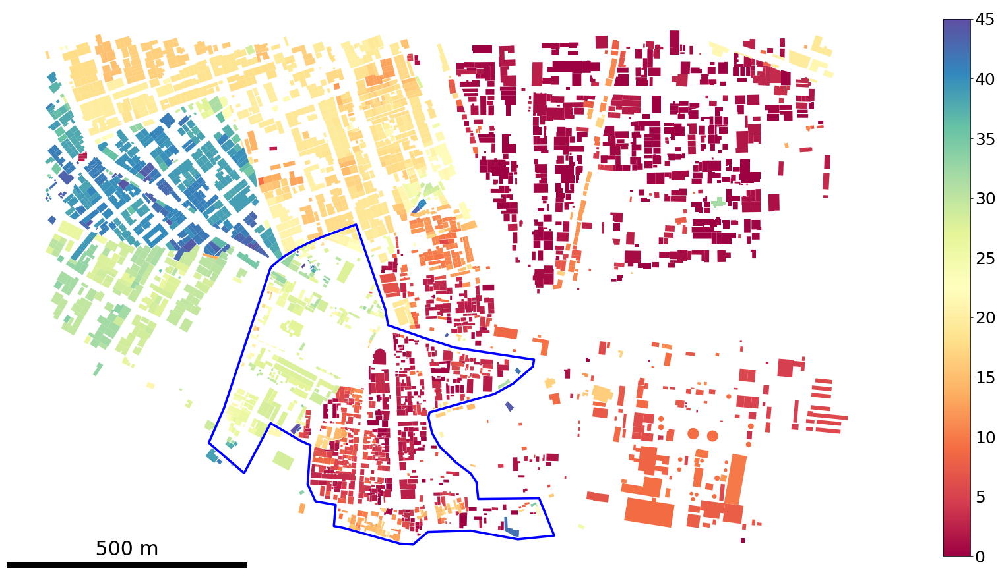

In [21]:
# Plot buildings' orientations in AZITO
f, ax = plt.subplots(figsize=(30, 20))
buildings_azi.plot(ax=ax, column='n_car_dev', vmin=0, vmax=45,
                   categorical=False, cmap='Spectral',
                   legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_car_dev_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

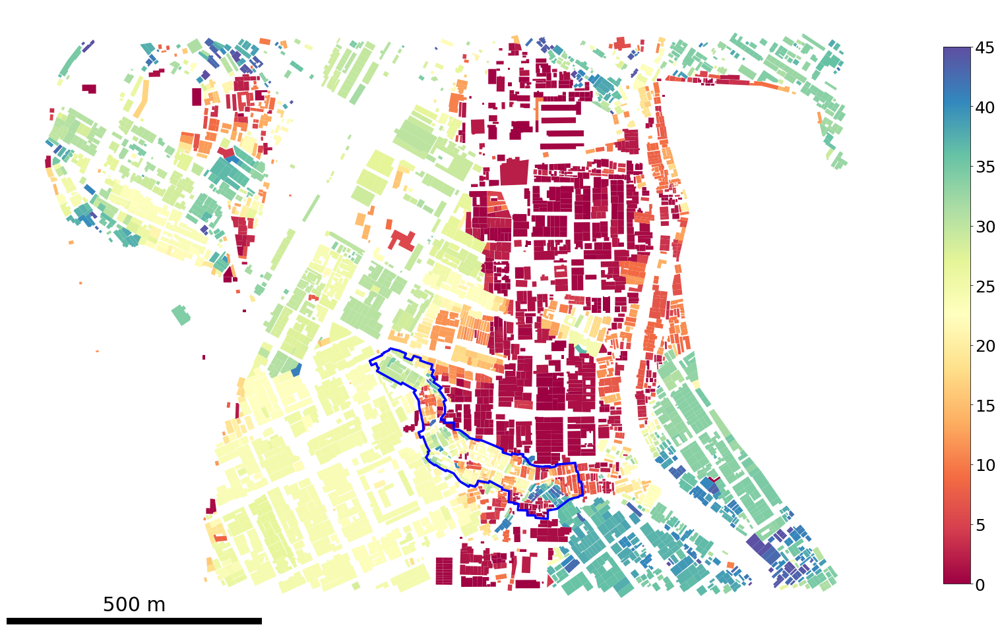

In [22]:
# Plot buildings' orientations in WILLY
f, ax = plt.subplots(figsize=(30, 20))
buildings_willy.plot(ax=ax, column='n_car_dev', vmin=0, vmax=45,
                     categorical=False, cmap='Spectral',
                     legend=True,legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=3.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_car_dev_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

#### 2.3.2. Calculate orientation differences (between neighbouring buildings)

In [23]:
class AlignmentMax:

    """
    Calculate the maximum deviation of solar orientation of objects on adjacent cells
    from an object
    
    Parameters
    ----------
    gdf : GeoDataFrame
        GeoDataFrame containing objects to analyse
    spatial_weights : libpysal.weights, optional
        spatial weights matrix
    orientations : str, list, np.array, pd.Series
        the name of the left dataframe column, ``np.array``, or ``pd.Series`` where is
        stored object orientation value
        (can be calculated using :class:`momepy.Orientation`)
    unique_id : str
        name of the column with unique id used as ``spatial_weights`` index.
    verbose : bool (default True)
        if True, shows progress bars in loops and indication of steps
        
    Attributes
    ----------
    series : Series
        Series containing resulting values
    gdf : GeoDataFrame
        original GeoDataFrame
    orientations : Series
        Series containing used orientation values
    sw : libpysal.weights
        spatial weights matrix
    id : Series
        Series containing used unique ID
    """

    def __init__(self, gdf, spatial_weights, unique_id, orientations, verbose=True):
        self.gdf = gdf
        self.sw = spatial_weights
        self.id = gdf[unique_id]

        # define empty list for results
        results_list = []
        gdf = gdf.copy()
        if not isinstance(orientations, str):
            gdf["mm_o"] = orientations
            orientations = "mm_o"
        self.orientations = gdf[orientations]

        data = gdf.set_index(unique_id)[orientations]

        # iterating over rows one by one
        for index, orient in tqdm(
            data.iteritems(), total=data.shape[0], disable=not verbose
        ):
            if index in spatial_weights.neighbors.keys():
                neighbours = spatial_weights.neighbors[index]
                if neighbours:
                    orientation = data.loc[neighbours]
                    results_list.append(abs(orientation - orient).max())
                else:
                    results_list.append(np.nan)
            else:
                results_list.append(np.nan)

        self.series = pd.Series(results_list, index=gdf.index)

In [24]:
# AZITO

# Neighbour relations : first 4 neighbours
w = weights.KNN.from_dataframe(buildings_azi,k=4) # contiguity matrix : first 4 neighbours

# MEAN DEVIATION between nearest 4 buildings:
buildings_azi['n_mn_Bdev'] = momepy.Alignment(buildings_azi,
                                              w, unique_id='ID_momepy',
                                              orientations=buildings_azi['n_car_dev'],
                                              verbose=True).series

# MAX DEVIATION between nearest 4 buildings:
buildings_azi['n_mx_Bdev'] = AlignmentMax(buildings_azi,
                                          w, unique_id='ID_momepy',
                                          orientations=buildings_azi['n_car_dev'],
                                          verbose=True).series

# check values
print([np.max(buildings_azi.n_mn_Bdev),
       np.min(buildings_azi.n_mn_Bdev),
       np.max(buildings_azi.n_mx_Bdev),
       np.min(buildings_azi.n_mx_Bdev)])

  0%|          | 0/2993 [00:00<?, ?it/s]

100%|██████████| 2993/2993 [00:01<00:00, 2749.70it/s]

[37.10921894849278, 4.05670164127514e-10, 42.4214499244482, 1.0272600547978072e-09]


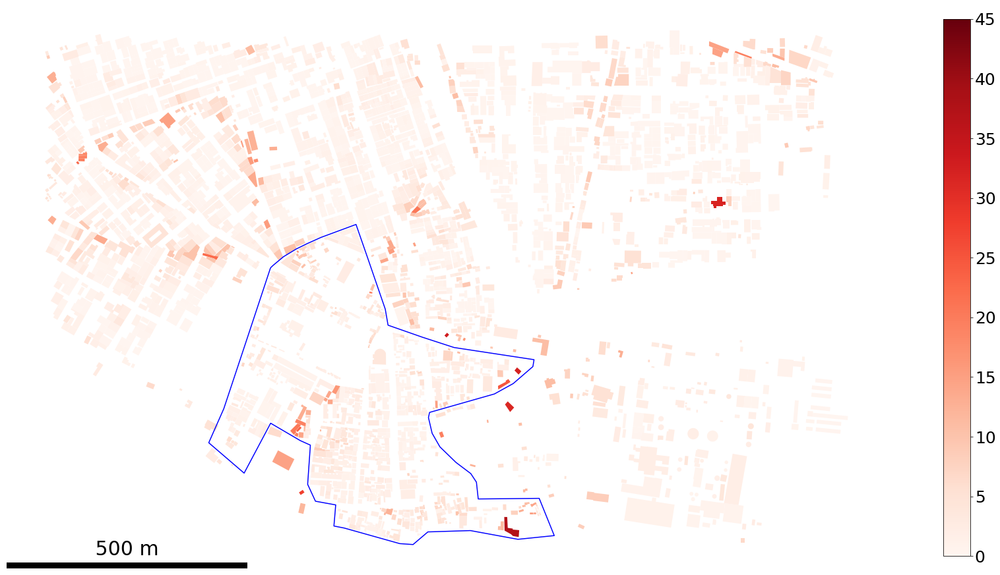

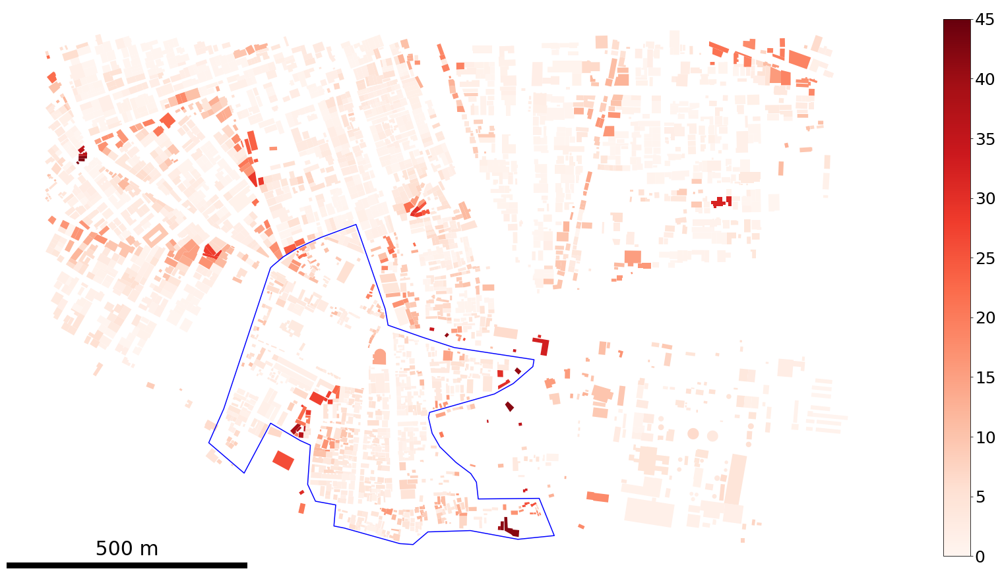

In [25]:
# Plot MEAN orientation differences - AZITO
f, ax = plt.subplots(figsize=(30, 20))
buildings_azi.plot(ax=ax, column='n_mn_Bdev',
                   vmin=0, vmax=45, cmap='Reds',
                   legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=1.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_mn_Bdev_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

# Plot MAX orientation differences - AZITO
f, ax = plt.subplots(figsize=(30, 20))
buildings_azi.plot(ax=ax, column='n_mx_Bdev',
                   vmin=0, vmax=45, cmap='Reds',
                   legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_azi.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=1.5)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_mx_Bdev_Azito.png"),
            dpi=600,
            bbox_inches='tight'
           )

In [26]:
# AZITO

# Neighbour relations : first 4 neighbours
w = weights.KNN.from_dataframe(buildings_willy,k=4) # contiguity matrix : first 4 neighbours

# MEAN DEVIATION between nearest 4 buildings:
buildings_willy['n_mn_Bdev'] = momepy.Alignment(buildings_willy,
                                              w, unique_id='ID_momepy',
                                              orientations=buildings_willy['n_car_dev'],
                                              verbose=True).series

# MAX DEVIATION between nearest 4 buildings:
buildings_willy['n_mx_Bdev'] = AlignmentMax(buildings_willy,
                                          w, unique_id='ID_momepy',
                                          orientations=buildings_willy['n_car_dev'],
                                          verbose=True).series

# check values
print([np.max(buildings_willy.n_mn_Bdev),
       np.min(buildings_willy.n_mn_Bdev),
       np.max(buildings_willy.n_mx_Bdev),
       np.min(buildings_willy.n_mx_Bdev)])

  0%|          | 0/4526 [00:00<?, ?it/s]

100%|██████████| 4526/4526 [00:01<00:00, 2769.78it/s]

[37.98977179165183, 4.901323791273171e-11, 43.953596561113386, 1.7257661966141313e-10]


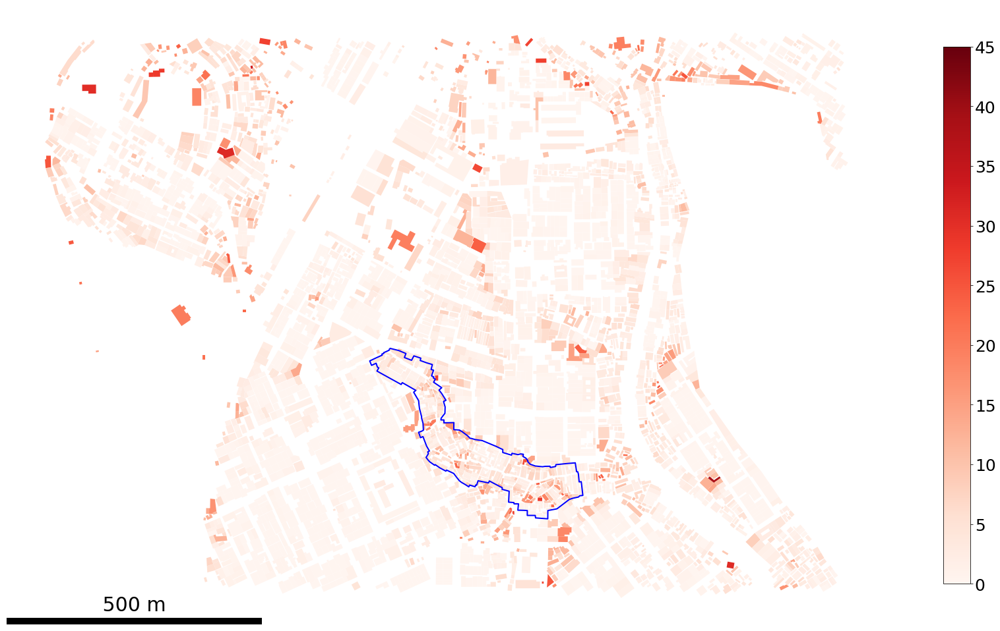

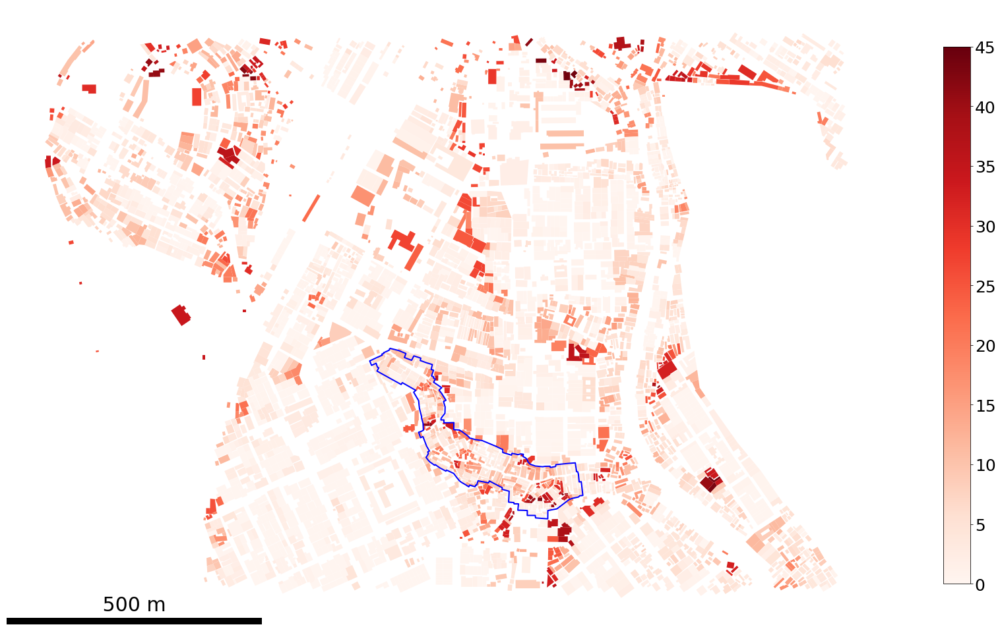

In [27]:
# Plot MEAN orientation differences - WILLY
f, ax = plt.subplots(figsize=(30, 20))
buildings_willy.plot(ax=ax, column='n_mn_Bdev',
                     vmin=0, vmax=45, cmap='Reds',
                     legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=2)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_mn_Bdev_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

# Plot MAX orientation differences - WILLY
f, ax = plt.subplots(figsize=(30, 20))
buildings_willy.plot(ax=ax, column='n_mx_Bdev',
                     vmin=0, vmax=45, cmap='Reds',
                     legend=True, legend_kwds={'shrink': 0.75})
ax.set_axis_off()
ax.add_artist(ScaleBar(dx=1,
                       units="m",
                       dimension="si-length",
                       length_fraction=0.25,
                       scale_formatter=lambda value, unit: f' {value} m ',
                       location='lower left',
                       scale_loc='top',
                       fixed_value=500,
                       font_properties={'size':30}
                      ))
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=25)
perimetre_willy.plot(ax=ax, edgecolor='blue', facecolor="none", linewidth=2)
plt.show()

# SAVE plot
fig = ax.get_figure()
fig.savefig(path.join(root_dir,
                      "data/outputs/plots/momepy_Abidjan/ABI_momepy_n_mx_Bdev_Willy.png"),
            dpi=600,
            bbox_inches='tight'
           )

In [28]:
## AGGREGATED MORPHOLOGICAL INDICATORS WITHIN 100m BUFFER - BUILDINGS

# Apply distance weights matrices to obtain aggregated values within specified range (max. distance = 100 m)
gdf_list = [buildings_azi,buildings_willy]
var_list = ['NN_100', 'n_blg_cc', 'n_mn_Bdev', 'n_mx_Bdev']

for gdf in gdf_list :
    
    # Calculate MEAN values : set up row-standardized, distance weights matrix
    gdf_centroid = gdf.copy() # dummy gdf
    gdf_centroid.geometry = gdf.geometry.centroid # dummy geometry set to centroid, only for weights matrix
    w = weights.DistanceBand.from_dataframe(gdf_centroid,100) # contiguity matrix : max. range = 100 m
    w = weights.insert_diagonal(w,val=1.0) # matrix diagonal : include i-th cell in spatial lag
    w.transform = 'R' # row-standardized matrix : obtain mean values of i-th cell + neighbours within 100 m range
    for var in var_list:
        lagged_var = var+'M'
        gdf[lagged_var] = np.nan
        gdf[lagged_var] = weights.spatial_lag.lag_spatial(w,gdf[var]) # r-standardized matrix gives mean of values
        
    # Calculate PROPORTIONS of morphological categories
    gdf_centroid = gdf.copy() # dummy gdf
    gdf_centroid.geometry = gdf.geometry.centroid # dummy geometry set to centroid, only for weights matrix
    w = weights.DistanceBand.from_dataframe(gdf_centroid,100) # contiguity matrix ('knn') : first 4 neighbours
    w = weights.insert_diagonal(w,val=1.0) # matrix diagonal : include i-th cell in spatial lag
    for var in var_list:
        # threshold to categorize 'high' and 'low' values
        if var == 'NN_100':
            threshold = 215 # rounded series mean of both cities
        elif var == 'n_blg_cc':
            threshold = 0.45 # rounded series mean of both cities
        elif var == 'n_mn_Bdev':
            threshold = 15 # manually calibrated threshold
        elif var == 'n_mx_Bdev':
            threshold = 25 # manually calibrated threshold
        mask = (gdf[var]>=threshold)
        # selection variable (based on thresholds above)
        sel_var = var+'S'
        gdf[sel_var] = 0
        gdf[sel_var][mask] = 1
        # calculate proportions
        new_var = var+'P' # proportion variable (%)
        gdf[new_var] = np.nan
        gdf[new_var] = weights.spatial_lag.lag_spatial(w,gdf[sel_var]) # number of neighbours in 'high' category
        gdf[new_var] = (gdf[new_var]/(gdf['NN_100']+1))*100 # proportion = sum of neighbours in 'high' cat./total neighbours within range

In [29]:
## AGGREGATED MORPHOLOGICAL INDICATORS WITHIN 100m BUFFER - TESSELLATION

# Apply distance weights matrices to obtain aggregated values within specified range (max. distance = 100 m)
gdf_list = [tessellation_azi_gdf,tessellation_willy_gdf]
var_list = ['n_CAR','n_tes_cc']

for gdf in gdf_list :
    
    # Calculate MEAN values : set up row-standardized, distance weights matrix
    gdf_centroid = gdf.copy() # dummy gdf
    gdf_centroid.geometry = gdf.geometry.centroid # dummy geometry set to centroid, only for weights matrix
    w = weights.DistanceBand.from_dataframe(gdf_centroid,100) # contiguity matrix : max. range = 100 m
    w = weights.insert_diagonal(w,val=1.0) # matrix diagonal : include i-th cell in spatial lag
    w.transform = 'R' # row-standardized matrix : obtain mean values of i-th cell + neighbours within 100 m range
    for var in var_list:
        lagged_var = var+'M'
        gdf[lagged_var] = np.nan
        gdf[lagged_var] = weights.spatial_lag.lag_spatial(w,gdf[var]) # r-standardized matrix gives mean of values
        
    # Calculate PROPORTIONS of morphological categories
    gdf_centroid = gdf.copy() # dummy gdf
    gdf_centroid.geometry = gdf.geometry.centroid # dummy geometry set to centroid, only for weights matrix
    w = weights.DistanceBand.from_dataframe(gdf_centroid,100) # contiguity matrix ('knn') : first 4 neighbours
    w = weights.insert_diagonal(w,val=1.0) # matrix diagonal : include i-th cell in spatial lag
    for var in var_list:
        # threshold to categorize 'high' and 'low' values
        if var == 'n_CAR':
            threshold = 0.60 # rounded series mean of both cities
        elif var == 'n_tes_cc':
            threshold = 0.45 # rounded series mean of both cities
        mask = (gdf[var]>=threshold)
        # selection variable (based on thresholds above)
        sel_var = var+'S'
        gdf[sel_var] = 0
        gdf[sel_var][mask] = 1
        # calculate number of neighbour tessellation cells within 100m
        gdf['T_count'] = 1 # 1 cell = 1 count
        gdf['NT_100'] = np.nan
        gdf['NT_100'] = weights.spatial_lag.lag_spatial(w,gdf['T_count']) # number of cells within 100 m
        # calculate proportions
        new_var = var+'P' # proportion variable (%)
        gdf[new_var] = np.nan
        gdf[new_var] = weights.spatial_lag.lag_spatial(w,gdf[sel_var]) # number of neighbours in 'high' category
        gdf[new_var] = (gdf[new_var]/(gdf['NT_100']+1))*100 # proportion = sum of neighbours in 'high' cat./total neighbours within range